# Cascadia Margin Lipid Modeling

In [1]:
from os.path import join
import pandas as pd
import numpy as np

In [2]:
import matplotlib.pyplot as plt

In [3]:
import pymc as pm
import arviz as az

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


## configuration

In [4]:
from matplotlib import style

In [5]:
style.use(join("..", "style.mplstyle"))
datadir = join("..", "data", "processed")

## load data

### relative abundance and d13C of GDGT compounds

In [6]:
df = pd.read_excel(join(datadir, "CascadiaMargin_carbon_abundance.xlsx"))
df.replace(
    {"Astoria Cyn": "Astoria Canyon", "Mcarthur cyn": "Mcarthur Canyon"}, inplace=True
)
df.sample(10)

,Sample Name,Location,Compound,m_from_plume,depth_int,avg_ugC,F2/F1,d13c_avg,stdev,purity_score,rel_abund
85,S43,Hydrate Ridge,G0,10.0,0-1,1.347682,22.801549,-63.984705,0.323799,0.960000,0.373155
244,S111,Mcarthur Canyon,G5,0.0,2-3,NaN,NaN,NaN,NaN,NaN,0.010693
233,S109,Mcarthur Canyon,G1,0.0,0-1,NaN,NaN,NaN,NaN,NaN,0.067539
87,S43,Hydrate Ridge,G2,10.0,0-1,1.470512,18.077729,-114.138522,0.692564,1.000000,0.259985
119,S63,Hydrate Ridge,Cren,60.0,2-3,3.766623,12.042715,-19.513813,0.104101,0.900729,0.364650
83,S41,Hydrate Ridge,G5,0.0,4-6,NaN,NaN,NaN,NaN,NaN,0.020811
121,S63,Hydrate Ridge,G1,60.0,2-3,0.832087,11.272611,-44.774971,0.319662,0.863115,0.093207
199,S101,Mcarthur Canyon,G2,30.0,4-6,1.573379,7.708301,-21.461305,0.130195,0.796973,0.039425
162,S77,Hydrate Ridge,G0,30.0,4-6,4.331340,48.366013,-21.396434,0.033936,1.001834,0.437632
73,S40,Hydrate Ridge,G2,0.0,3-4,1.476633,14.351218,-76.881724,0.254851,0.894794,0.073793


## Modeling

### data setup

unified table

In [7]:
data = df[["Sample Name", "Location", "Compound", "d13c_avg", "rel_abund"]]
data = data.pivot(columns="Compound", index=["Location", "Sample Name"])
data.head()

d13c_avg                                      \
Compound                       Cren     G0     G1     G2     G3  G4  G5   
Location       Sample Name                                                
Astoria Canyon S1            -22.73 -30.91    NaN -83.71    NaN NaN NaN   
               S10           -31.55 -35.05 -78.34 -91.61    NaN NaN NaN   
               S11           -36.44 -36.78 -84.06 -96.46 -94.52 NaN NaN   
               S3               NaN    NaN    NaN    NaN    NaN NaN NaN   
               S4            -23.87 -48.29    NaN -85.14    NaN NaN NaN   

                           rel_abund                                          \
Compound                        Cren        G0        G1        G2        G3   
Location       Sample Name                                                     
Astoria Canyon S1           0.306266  0.389506  0.097763  0.157369  0.042605   
               S10          0.190468  0.272736  0.108790  0.270738  0.134849   
               S11          0.151434  0.251405  0.116905  0.282700  0.168619   
               S3           0.287896  0.428023  0.118678  0.137595  0.020541   
               S4           0.219767  0.481303  0.112187  0.158765  0.021725   

                                                
Compound                          G4        G5  
Location       Sample Name                      
Astoria Canyon S1           0.000274  0.006217  
               S10          0.019270  0.003149  
               S11          0.026520  0.002418  
               S3           0.003213  0.004054  
               S4           0.003057  0.003197

relative abundance table

In [8]:
relative_abundance = data["rel_abund"]
relative_abundance.sample(5)

,Compound,Cren,G0,G1,G2,G3,G4,G5
Location,Sample Name,,,,,,,
Hydrate Ridge,S61,0.334187,0.471017,0.084228,0.073511,0.005952,0.000268,0.030837
Mcarthur Canyon,S111,0.400500,0.463710,0.073831,0.042330,0.004932,0.004004,0.010693
Astoria Canyon,S11,0.151434,0.251405,0.116905,0.282700,0.168619,0.026520,0.002418
Mcarthur Canyon,S109,0.429915,0.442379,0.067539,0.042882,0.004140,0.002429,0.010716
Hydrate Ridge,S47,0.384373,0.422183,0.097873,0.071128,0.003828,0.000281,0.020334


In [9]:
assert all(np.isclose(relative_abundance.sum(axis=1).values, 1, rtol=1e-3))

In [10]:
relative_abundance.groupby(level=0).agg(["mean", "std"])

Compound             Cren                  G0                  G1            \
                     mean       std      mean       std      mean       std   
Location                                                                      
Astoria Canyon   0.224675  0.064108  0.372260  0.085086  0.114038  0.019510   
Hydrate Ridge    0.347166  0.054203  0.445774  0.027209  0.087188  0.022635   
Mcarthur Canyon  0.414621  0.012682  0.456807  0.013816  0.068277  0.004401   

Compound               G2                  G3                  G4            \
                     mean       std      mean       std      mean       std   
Location                                                                      
Astoria Canyon   0.201362  0.062735  0.074112  0.057568  0.009839  0.009523   
Hydrate Ridge    0.084476  0.048461  0.007215  0.005428  0.000537  0.000520   
Mcarthur Canyon  0.040846  0.004993  0.004700  0.000727  0.002830  0.001351   

Compound               G5            
                     mean       std  
Location                             
Astoria Canyon   0.003715  0.001278  
Hydrate Ridge    0.027645  0.014273  
Mcarthur Canyon  0.011918  0.001281

carbon isotopic fractionation table

In [11]:
d13C = data["d13c_avg"]
d13C.sample(5)

Compound                         Cren         G0          G1          G2  G3  \
Location       Sample Name                                                     
Hydrate Ridge  S45         -19.759240 -26.594328  -52.794625  -78.763360 NaN   
               S43         -26.631937 -63.984705 -100.832392 -114.138522 NaN   
Astoria Canyon S3                 NaN        NaN         NaN         NaN NaN   
Hydrate Ridge  S39         -19.791236 -26.681803  -53.711971  -67.926304 NaN   
               S46         -19.668410 -24.345985  -42.140914  -64.825093 NaN   

Compound                    G4  G5  
Location       Sample Name          
Hydrate Ridge  S45         NaN NaN  
               S43         NaN NaN  
Astoria Canyon S3          NaN NaN  
Hydrate Ridge  S39         NaN NaN  
               S46         NaN NaN

In [12]:
d13C.groupby(level=0).agg(["mean", "std"])

Compound              Cren                   G0                    G1  \
                      mean       std       mean        std       mean   
Location                                                                
Astoria Canyon  -27.500000  5.117011 -39.252857  12.583389 -78.583333   
Hydrate Ridge   -20.112818  1.751414 -25.830361  10.365047 -46.454807   
Mcarthur Canyon -18.948287  0.170264 -19.934959   0.935452 -22.907023   

Compound                           G2                 G3             G4      \
                       std       mean        std    mean       std mean std   
Location                                                                      
Astoria Canyon    5.359145 -89.108571   5.778086 -92.165  3.330473  NaN NaN   
Hydrate Ridge    15.803619 -68.493641  15.006748     NaN       NaN  NaN NaN   
Mcarthur Canyon   5.434851 -28.755275  13.681861     NaN       NaN  NaN NaN   

Compound          G5      
                mean std  
Location                  
Astoria Canyon   NaN NaN  
Hydrate Ridge    NaN NaN  
Mcarthur Canyon  NaN NaN

In [13]:
d13C.groupby(level=0).apply(lambda sl: sl.notnull().sum() / len(sl))

Compound,Cren,G0,G1,G2,G3,G4,G5
Location,,,,,,,
Astoria Canyon,0.875,0.875,0.375000,0.875000,0.25,0.0,0.0
Hydrate Ridge,1.000,1.000,1.000000,1.000000,0.00,0.0,0.0
Mcarthur Canyon,1.000,1.000,0.230769,0.230769,0.00,0.0,0.0


the order of the compounds and the lengths of different dimensions

In [14]:
GDGTs = ["G0", "G1", "G2", "G3", "G4", "Cren", "G5"]  # careful with the ordering here
nchem = len(GDGTs)
communities = [
    "planktonic",
    "benthic-methane cycling",
    "benthic-non-methane cycling",
]
ncom = len(communities)
locations = data.index.levels[0]
nloc = len(locations)
locations

Index(['Astoria Canyon', 'Hydrate Ridge', 'Mcarthur Canyon'], dtype='object', name='Location')

ranges for the proportions of the compounds produced by each community, which go into the priors for `X`

In [15]:
X_lo = np.array(
    [
        [0.2, 0.0, 0.0, 0.0, 0.0, 0.2, 0.0],
        [0.2, 0.05, 0.2, 0.05, 0.0, 0.0, 0.0],
        [0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
    ]
)
X_hi = np.array(
    [
        [0.8, 0.2, 0.1, 0.05, 1e-2, 0.5, 0.05],
        [0.5, 0.2, 0.5, 0.2, 0.1, 1e-2, 1e-2],
        [0.5, 0.3, 0.3, 0.3, 0.3, 1e-2, 0.1],
    ]
)

ranges for the dC13 values produced by each community, informing the priors for `D`

In [16]:
D_lo = np.array([-22, -120, -30])
D_hi = np.array([-18, -40, -22])

### model definition

In [17]:
# this depends on the ordering of the inputs, as defined above
def methane_index(A):
    # G1, G2, G3
    num = pm.math.sum(A[:, 1:4], axis=1, keepdims=True)
    # G1, G2, G3
    den = pm.math.sum(A[:, 1:4], axis=1, keepdims=True)
    # Cren, G5
    den += pm.math.sum(A[:, -2:], axis=1, keepdims=True)
    return num / den

In [18]:
with pm.Model() as model:

    # compositional priors for the contributions of different microbial communities
    F = pm.Dirichlet("F", a=np.full(ncom, 1.0), shape=(nloc, ncom))

    # production compositional priors for each compound in each community
    X_ = pm.Beta("X*", mu=(X_hi + X_lo) / 2, sigma=(X_hi - X_lo) / 4)
    # rows must be normalized (sum to 1)
    X = pm.Deterministic("X", X_ / pm.math.sum(X_, axis=1, keepdims=True))

    # relative abundance, given F and X
    M = pm.Deterministic("M", pm.math.dot(F, X))

    # methane indices for the two matrices
    pm.Deterministic("Community Methane Index", methane_index(X))
    pm.Deterministic("Location Methane Index", methane_index(M))

    # variance parameters for relative abundances
    sigma_abundance = pm.Beta("sigma abundance", alpha=1, beta=20, shape=(nloc, nchem))

    # relative abundance likelihood
    for i, location in enumerate(locations):
        pm.TruncatedNormal(
            f"{location}\nobserved\nabundance",
            mu=M[i, :],
            sigma=sigma_abundance[i, :],
            observed=relative_abundance[GDGTs].loc[location].values,
            lower=0,
            upper=1,
        )

    # delta C 13 end members
    D = pm.Normal("D", mu=(D_hi + D_lo) / 2, sigma=(D_hi - D_lo) / 4)

    C = pm.Deterministic("C", pm.math.dot(F * D, X) / M)

    sigma_d13c = pm.Exponential("sigma d13C", scale=25, shape=(nloc, nchem))

    for i, location in enumerate(locations):
        for j, compound in enumerate(GDGTs):
            d = d13C[compound].loc[location].dropna().values
            if len(d) > 0:
                pm.Normal(
                    f"{location}\nobserved\n{compound} d13C",
                    mu=C[i, j],
                    sigma=sigma_d13c[i, j],
                    observed=d,
                )

In [19]:
model

                                 F ~ Dirichlet(<constant>)
                                X* ~ Beta(<constant>, <constant>)
                   sigma abundance ~ Beta(1, 20)
                                 D ~ Normal(<constant>, <constant>)
                        sigma d13C ~ Exponential(25)
                                 X ~ Deterministic(f(X*))
                                 M ~ Deterministic(f(F, X*))
           Community Methane Index ~ Deterministic(f(X*))
            Location Methane Index ~ Deterministic(f(F, X*))
                                 C ~ Deterministic(f(F, X*, D))
 Astoria Canyon
observed
abundance ~ TruncatedNormal(f(F, X*), f(sigma abundance), 0, 1)
  Hydrate Ridge
observed
abundance ~ TruncatedNormal(f(F, X*), f(sigma abundance), 0, 1)
Mcarthur Canyon
observed
abundance ~ TruncatedNormal(f(F, X*), f(sigma abundance), 0, 1)
   Astoria Canyon
observed
G0 d13C ~ Normal(f(F, X*, D), f(sigma d13C))
   Astoria Canyon
observed
G1 d13C ~ Normal(f(F, X*, D), f(sigma

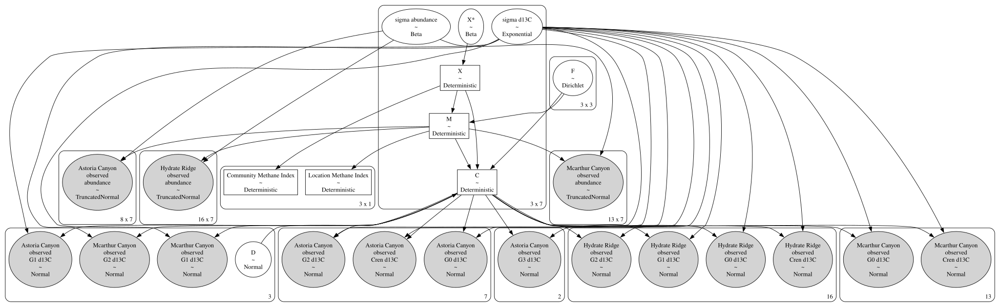

In [20]:
pm.model_to_graphviz(model)

### prior predictive checks

In [21]:
with model:
    prior = pm.sample_prior_predictive(samples=32_000)
prior.prior.to_netcdf("../model-results/prior.nc")

Sampling: [Astoria Canyon
observed
Cren d13C, Astoria Canyon
observed
G0 d13C, Astoria Canyon
observed
G1 d13C, Astoria Canyon
observed
G2 d13C, Astoria Canyon
observed
G3 d13C, Astoria Canyon
observed
abundance, D, F, Hydrate Ridge
observed
Cren d13C, Hydrate Ridge
observed
G0 d13C, Hydrate Ridge
observed
G1 d13C, Hydrate Ridge
observed
G2 d13C, Hydrate Ridge
observed
abundance, Mcarthur Canyon
observed
Cren d13C, Mcarthur Canyon
observed
G0 d13C, Mcarthur Canyon
observed
G1 d13C, Mcarthur Canyon
observed
G2 d13C, Mcarthur Canyon
observed
abundance, X*, sigma abundance, sigma d13C]


<Figure size 960x720 with 0 Axes>

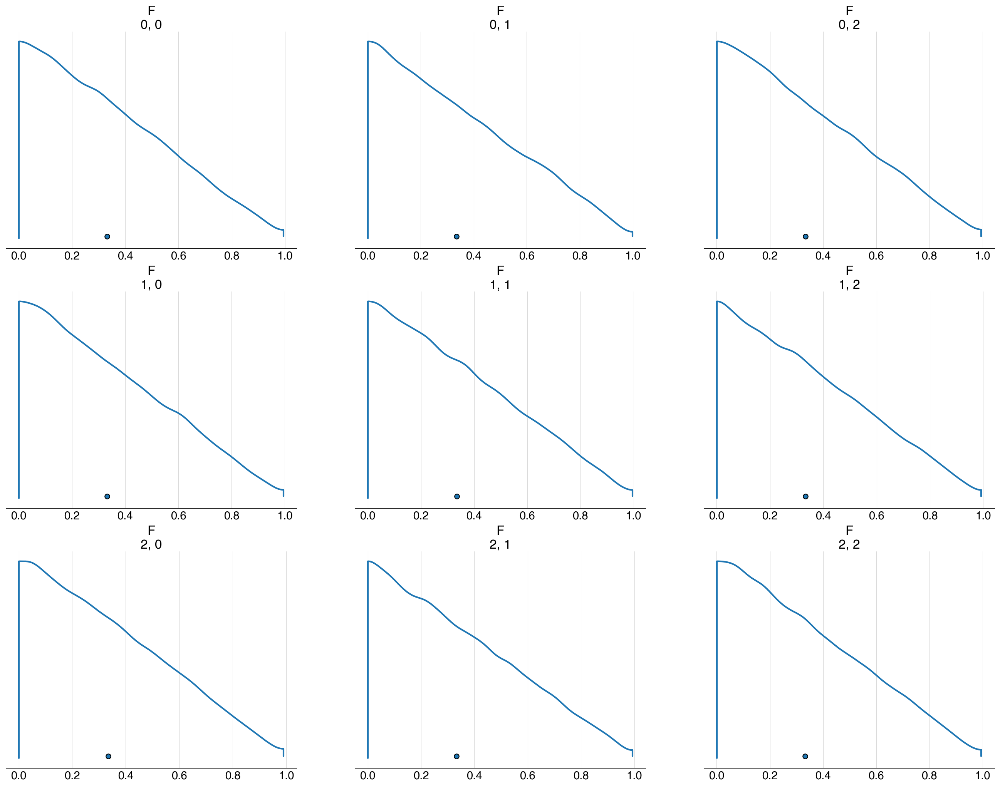

In [22]:
fig = plt.figure()
az.plot_density(prior.prior, var_names="F", hdi_prob=1, grid=(3, 3))
fig.tight_layout()

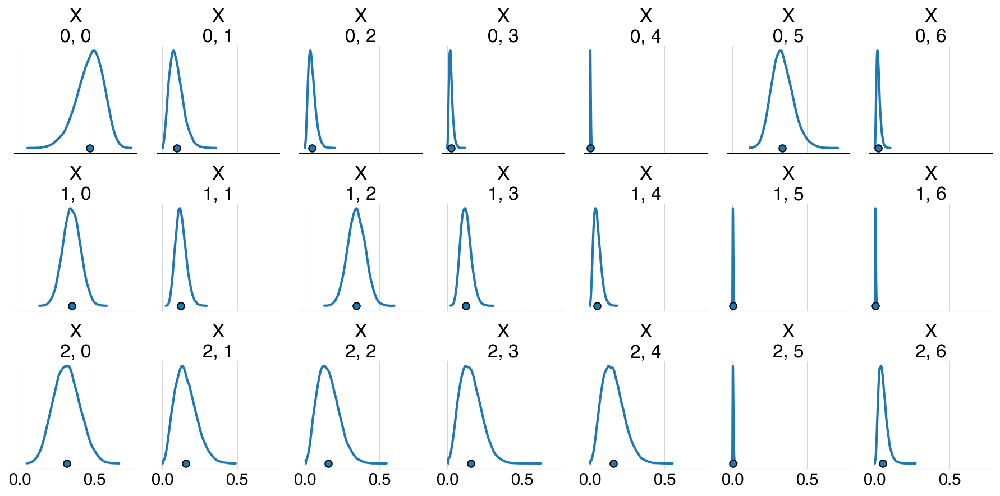

In [23]:
fig, axs = plt.subplots(3, 7, figsize=(12, 6), sharex=True)
az.plot_density(prior.prior, var_names="X", hdi_prob=1, ax=axs)
fig.tight_layout()

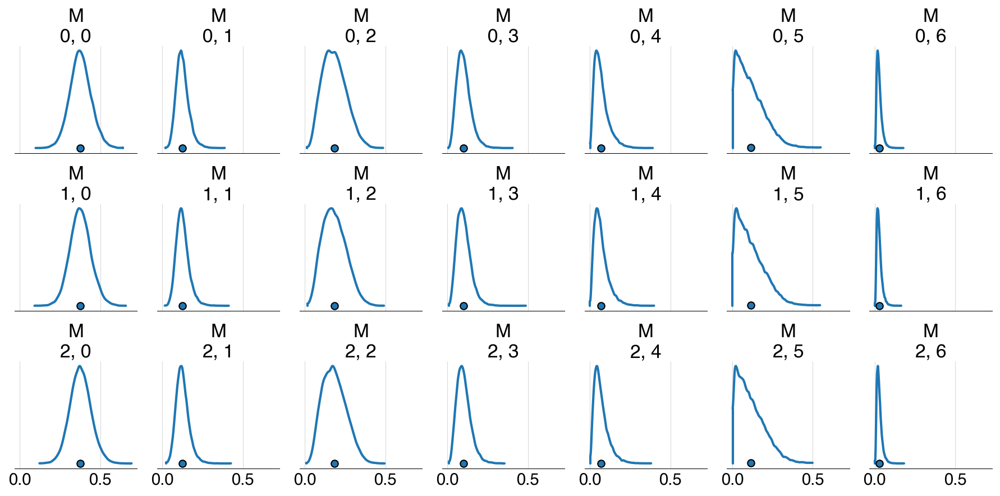

In [24]:
fig, axs = plt.subplots(3, 7, figsize=(12, 6), sharex=True)
az.plot_density(prior.prior, var_names="M", hdi_prob=1, ax=axs)
fig.tight_layout()

<Figure size 960x720 with 0 Axes>

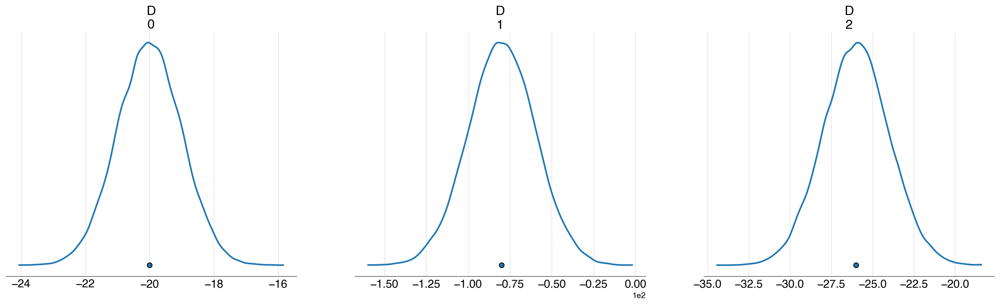

In [25]:
fig = plt.figure()
az.plot_density(prior.prior, var_names="D", hdi_prob=1)
fig.tight_layout()

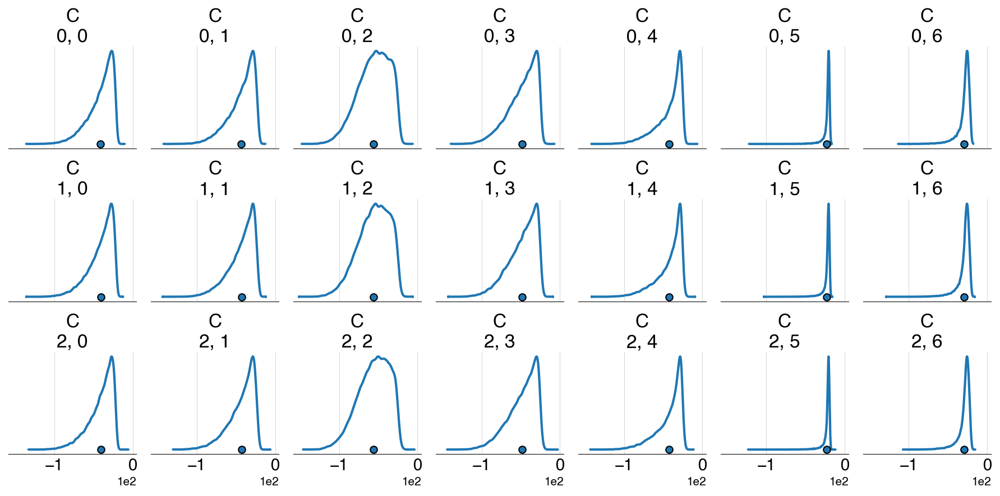

In [26]:
fig, axs = plt.subplots(3, 7, figsize=(12, 6), sharex=True)
az.plot_density(prior.prior, var_names="C", hdi_prob=1, ax=axs)
fig.tight_layout()

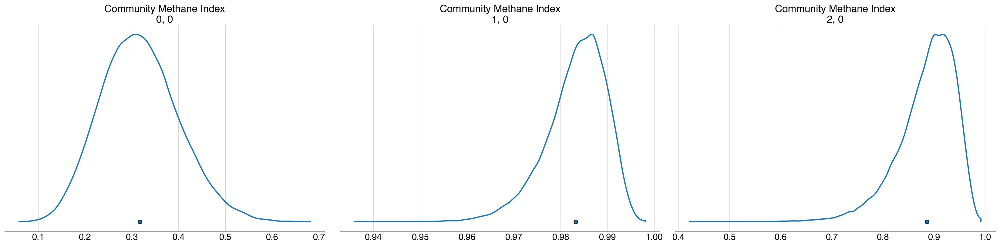

In [27]:
az.plot_density(prior.prior, var_names="Community Methane Index", hdi_prob=1)
plt.gcf().tight_layout()

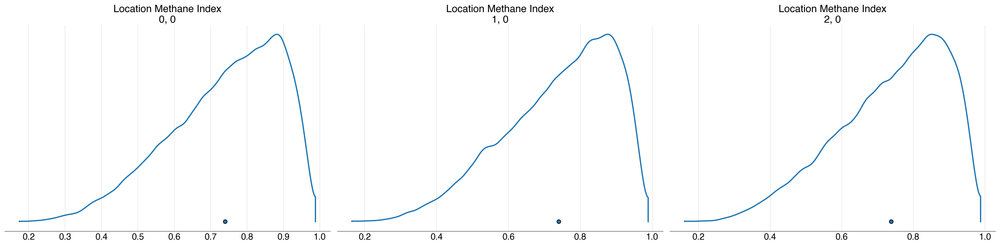

In [28]:
az.plot_density(prior.prior, var_names="Location Methane Index", hdi_prob=1)
plt.gcf().tight_layout()

### posterior sampling

In [29]:
with model:
    post = pm.sample(cores=16, chains=16, tune=4_000, draws=4_000, target_accept=0.975)
post.posterior.to_netcdf("../model-results/posterior.nc")

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (16 chains in 16 jobs)
NUTS: [F, X*, sigma abundance, D, sigma d13C]


Sampling 16 chains for 4_000 tune and 4_000 draw iterations (64_000 + 64_000 draws total) took 550 seconds.


### posterior checks

### rhat

In [30]:
rhat = az.rhat(post)

In [31]:
rhat["F"]

<xarray.DataArray 'F' (F_dim_0: 3, F_dim_1: 3)> Size: 72B
array([[1.00001013, 0.99997929, 1.00036047],
       [1.00010972, 1.00011624, 1.00011284],
       [1.00024896, 1.00020163, 1.00052008]])
Coordinates:
  * F_dim_0  (F_dim_0) int64 24B 0 1 2
  * F_dim_1  (F_dim_1) int64 24B 0 1 2

In [32]:
rhat["X"]

<xarray.DataArray 'X' (X_dim_0: 3, X_dim_1: 7)> Size: 168B
array([[1.00009703, 1.00008197, 1.0000862 , 1.00013115, 1.0001325 ,
        1.0001741 , 1.00030644],
       [1.0001503 , 1.00021924, 1.00006483, 1.00014107, 1.00027789,
        1.00014493, 1.00017658],
       [1.00032745, 1.00039775, 1.00020349, 1.00011549, 1.00032468,
        1.00017553, 1.00054322]])
Coordinates:
  * X_dim_0  (X_dim_0) int64 24B 0 1 2
  * X_dim_1  (X_dim_1) int64 56B 0 1 2 3 4 5 6

In [33]:
rhat["D"]

<xarray.DataArray 'D' (D_dim_0: 3)> Size: 24B
array([1.00008601, 1.00013141, 1.00025284])
Coordinates:
  * D_dim_0  (D_dim_0) int64 24B 0 1 2

#### ESS

In [34]:
ess = az.ess(post)

In [35]:
ess["F"]

<xarray.DataArray 'F' (F_dim_0: 3, F_dim_1: 3)> Size: 72B
array([[73198.92055842, 65297.21497722, 35326.20218413],
       [62779.99618864, 63576.15562802, 44386.14578718],
       [25174.80635039, 51688.71437245, 20540.7862952 ]])
Coordinates:
  * F_dim_0  (F_dim_0) int64 24B 0 1 2
  * F_dim_1  (F_dim_1) int64 24B 0 1 2

In [36]:
ess["X"]

<xarray.DataArray 'X' (X_dim_0: 3, X_dim_1: 7)> Size: 168B
array([[ 70547.24009371,  52560.88892608,  59279.42785561,
         47215.91199957,  96345.59188082,  31987.87935071,
         26501.74854453],
       [ 97476.11473593,  80767.21761531,  89825.46205963,
         94957.72087858,  89470.53891433,  98517.84759368,
         96379.37885697],
       [105746.80811466, 104530.56144545, 105190.13595126,
         52324.28957203,  46426.90705585, 115075.21818099,
         40603.30389696]])
Coordinates:
  * X_dim_0  (X_dim_0) int64 24B 0 1 2
  * X_dim_1  (X_dim_1) int64 56B 0 1 2 3 4 5 6

In [37]:
ess["D"]

<xarray.DataArray 'D' (D_dim_0: 3)> Size: 24B
array([ 87953.62504537,  51614.99407265, 149887.14023183])
Coordinates:
  * D_dim_0  (D_dim_0) int64 24B 0 1 2

#### traces

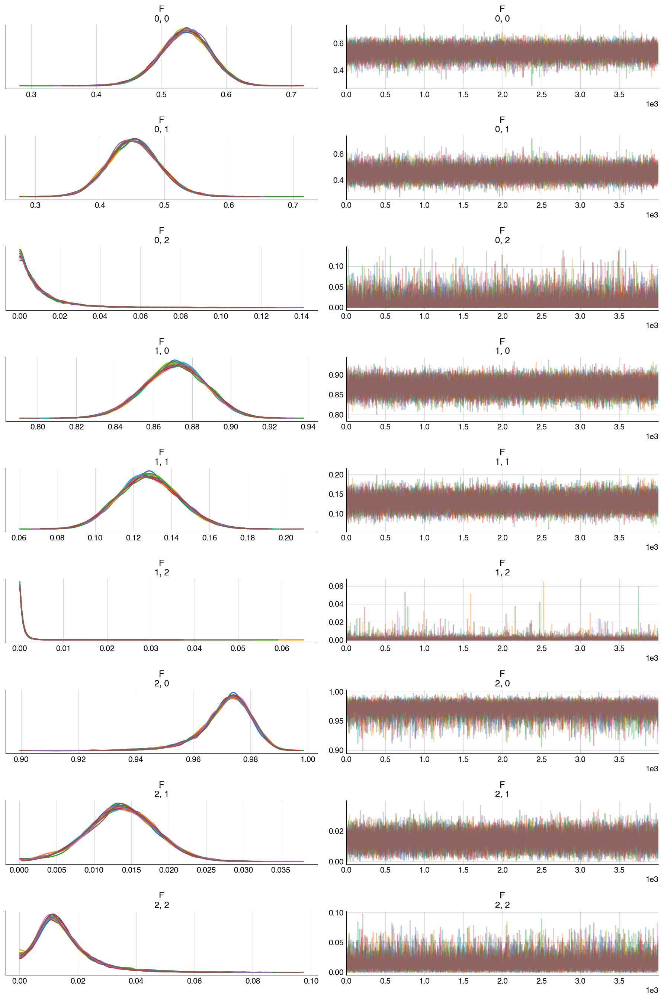

In [38]:
az.plot_trace(post, var_names=["F"], compact=False)
plt.gcf().tight_layout()

/Users/markbaum/Library/Caches/pypoetry/virtualenvs/cascadia-margin-lipids-mMstoHi0-py3.11/lib/python3.11/site-packages/arviz/plots/traceplot.py:222: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (21), generating only 20 plots
  warnings.warn(


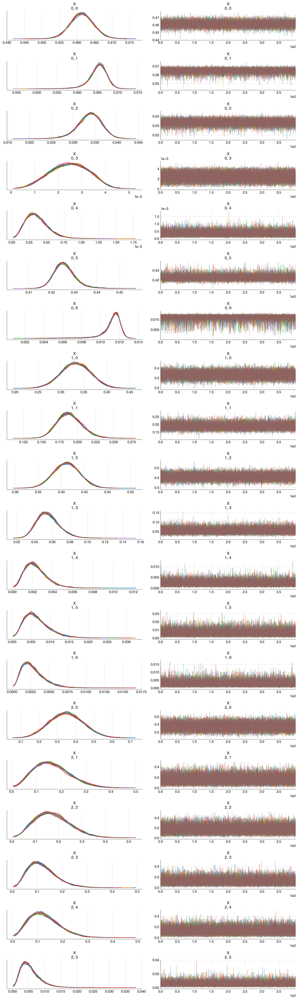

In [39]:
az.plot_trace(post, var_names="X", compact=False)
plt.gcf().tight_layout()

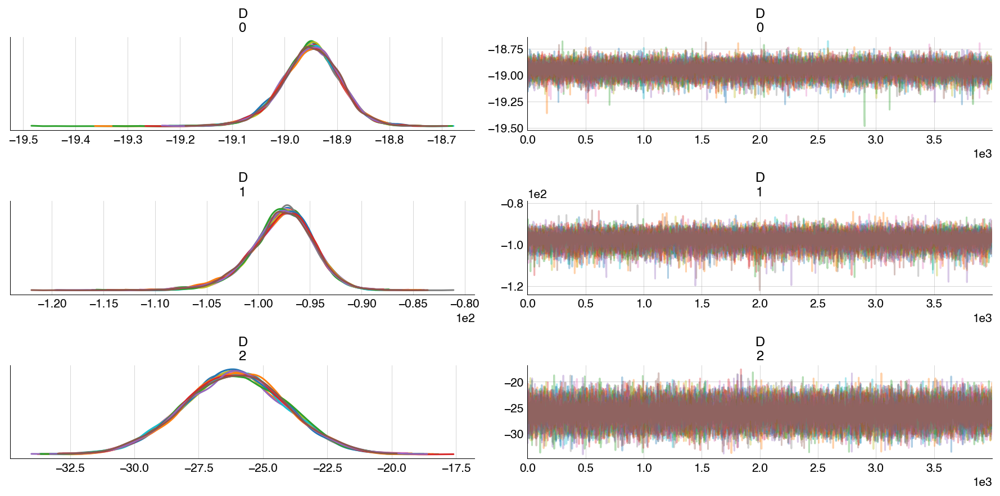

In [40]:
az.plot_trace(post, var_names=["D"], compact=False)
plt.gcf().tight_layout()

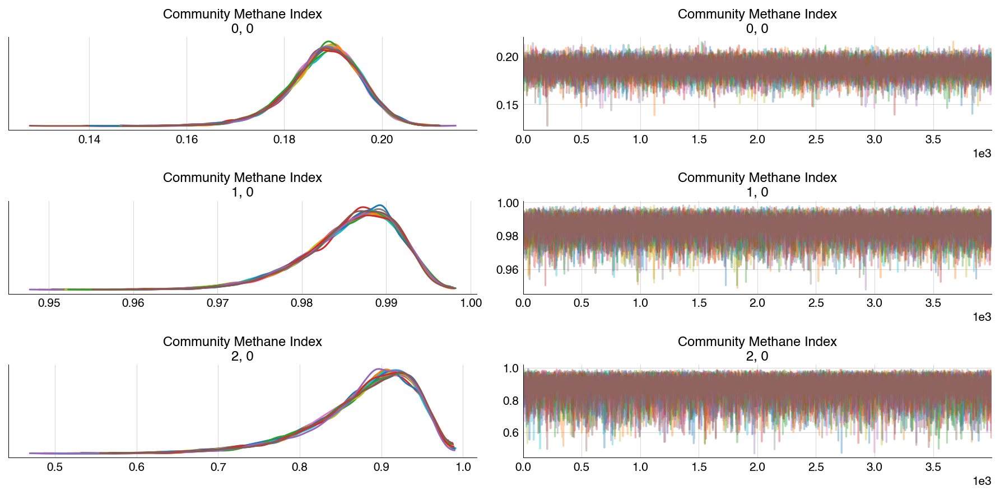

In [41]:
az.plot_trace(post, var_names=["Community Methane Index"], compact=False)
plt.gcf().tight_layout()

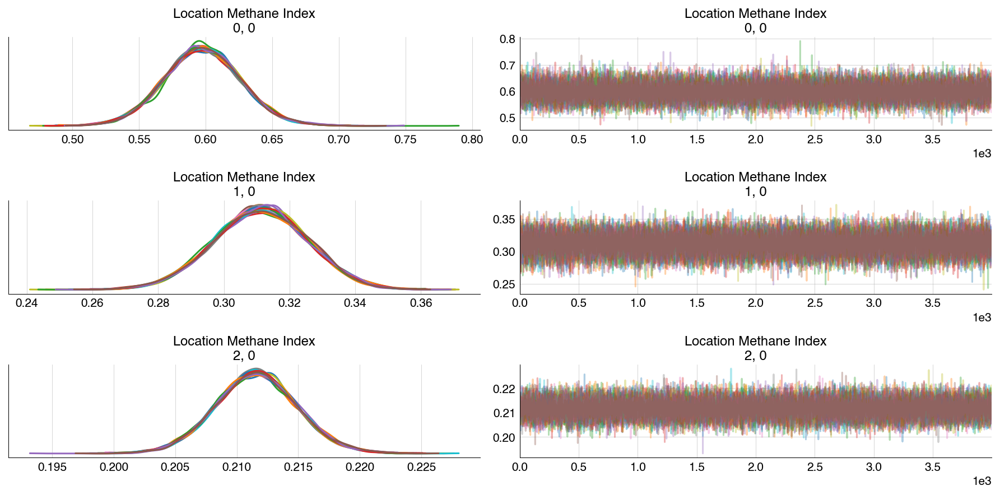

In [42]:
az.plot_trace(post, var_names=["Location Methane Index"], compact=False)
plt.gcf().tight_layout()

### posterior predictive

In [43]:
with model:
    ppc = pm.sample_posterior_predictive(post)
ppc.posterior_predictive.to_netcdf("../model-results/posterior_predictive.nc")

Sampling: [Astoria Canyon
observed
Cren d13C, Astoria Canyon
observed
G0 d13C, Astoria Canyon
observed
G1 d13C, Astoria Canyon
observed
G2 d13C, Astoria Canyon
observed
G3 d13C, Astoria Canyon
observed
abundance, Hydrate Ridge
observed
Cren d13C, Hydrate Ridge
observed
G0 d13C, Hydrate Ridge
observed
G1 d13C, Hydrate Ridge
observed
G2 d13C, Hydrate Ridge
observed
abundance, Mcarthur Canyon
observed
Cren d13C, Mcarthur Canyon
observed
G0 d13C, Mcarthur Canyon
observed
G1 d13C, Mcarthur Canyon
observed
G2 d13C, Mcarthur Canyon
observed
abundance]


/Users/markbaum/Library/Caches/pypoetry/virtualenvs/cascadia-margin-lipids-mMstoHi0-py3.11/lib/python3.11/site-packages/arviz/plots/ppcplot.py:267: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  flatten_pp = list(predictive_dataset.dims.keys())
/Users/markbaum/Library/Caches/pypoetry/virtualenvs/cascadia-margin-lipids-mMstoHi0-py3.11/lib/python3.11/site-packages/arviz/plots/ppcplot.py:271: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  flatten = list(observed_data.dims.keys())


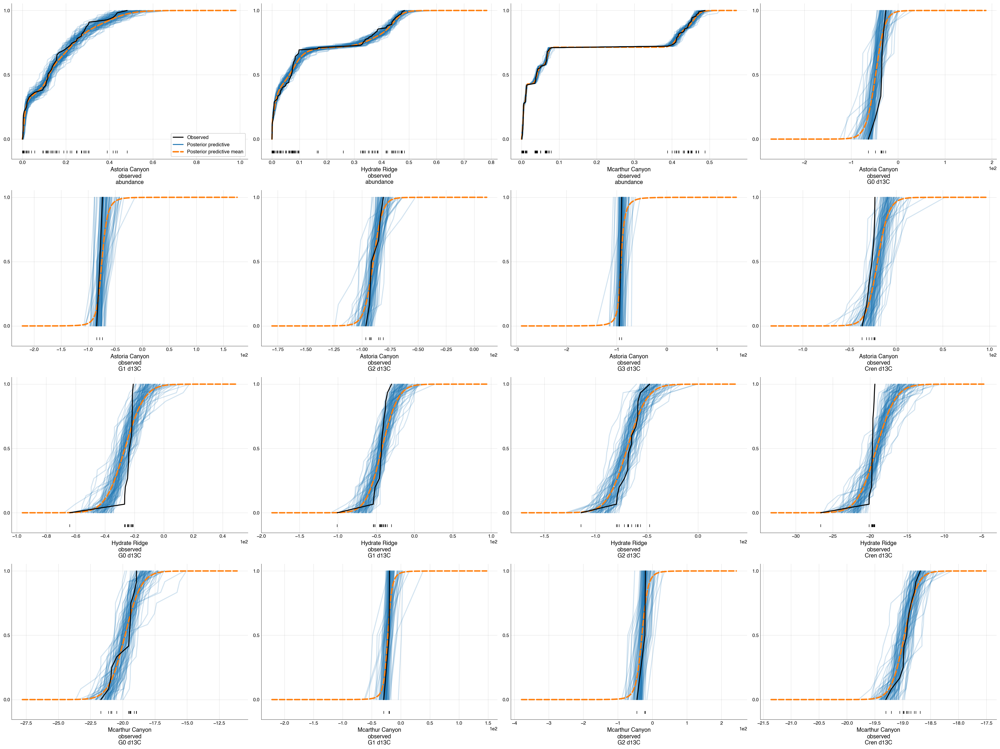

In [44]:
az.plot_ppc(ppc, num_pp_samples=100, observed_rug=True, kind="cumulative")
plt.gcf().tight_layout()